# Final

- Complete pipeline for Visual Similarity based Fashion Item Recommendation Engine

In [1]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import tensorflow as tf
from PIL import Image
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import resnet
import matplotlib.pyplot as plt
from skimage import io
%cd .\yolov5
from detect import generate_bbox
%matplotlib inline

C:\Users\CHIRAG\Desktop\DataScience\AAIC\Notes\Case_Studies\Myntra\yolov5


In [2]:
LOADED_MODELS = dict()
LOADED_CSVS = dict()
TARGET_SHAPE = (224,224,3)

In [11]:
def preprocess_image1(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape for Gender Classification
    """
    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.resize(image, TARGET_SHAPE[:2])
    return tf.expand_dims(image, axis=0)

def preprocess_image2(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape for Embedding Generation
    """
    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, TARGET_SHAPE[:2])
    image = resnet.preprocess_input(image)
    return tf.expand_dims(image, axis=0)

def load_models():
    """
    Load Various Models for Recommendation Engine Pipeline
    """
    if len(LOADED_MODELS) == 4:
        return True
    else:
        print("Loading Models...")
        GENDER_CLASSIFIER = load_model("..\\MODELS\\gender_classification_model.h5")
        TOPWEAR_EMBEDDING = load_model("..\\MODELS\\topwear_embedding.h5")
        BOTTOMWEAR_EMBEDDING = load_model("..\\MODELS\\bottomwear_embedding.h5")
        FOOTWEAR_EMBEDDING = load_model("..\\MODELS\\footwear_embedding.h5")
        
        LOADED_MODELS["gender_classifier"] = GENDER_CLASSIFIER
        LOADED_MODELS["topwear"] = TOPWEAR_EMBEDDING
        LOADED_MODELS["bottomwear"] = BOTTOMWEAR_EMBEDDING
        LOADED_MODELS["footwear"] = FOOTWEAR_EMBEDDING
        print("Models Loaded!")
        return True
    
def load_CSVs():
    """
    Load Various CSV files for Embedding Generation Pipeline
    """
    if len(LOADED_CSVS) == 6:
        return True
    else:
        print("Loading CSVs...")
        MENS_TOPWEAR_CSV = pd.read_csv("..\\CSVS\\mens_topwear_embeddings.csv")
        MENS_BOTTOMWEAR_CSV = pd.read_csv("..\\CSVS\\mens_bottomwear_embeddings.csv")
        MENS_FOOTWEAR_CSV = pd.read_csv("..\\CSVS\\mens_footwear_embeddings.csv")
        WOMENS_TOPWEAR_CSV = pd.read_csv("..\\CSVS\\womens_topwear_embeddings.csv")
        WOMENS_BOTTOMWEAR_CSV = pd.read_csv("..\\CSVS\\womens_bottomwear_embeddings.csv")
        WOMENS_FOOTWEAR_CSV = pd.read_csv("..\\CSVS\\womens_footwear_embeddings.csv")
        
        LOADED_CSVS["mens_topwear"] = MENS_TOPWEAR_CSV
        LOADED_CSVS["mens_bottomwear"] = MENS_BOTTOMWEAR_CSV
        LOADED_CSVS["mens_footwear"] = MENS_FOOTWEAR_CSV
        LOADED_CSVS["womens_topwear"] = WOMENS_TOPWEAR_CSV
        LOADED_CSVS["womens_bottomwear"] = WOMENS_BOTTOMWEAR_CSV
        LOADED_CSVS["womens_footwear"] = WOMENS_FOOTWEAR_CSV
        print("CSVs Loaded!")
        return True
    
def extract_clothes(image): 
    '''
    Extract Topwear, Bottomwear and Footwear from a given Image
    Note: In case there are multiple items of the same class, the item with highest confidence score is returned.
    
    Args:
        image: Path to the image file that you want to extract clothes from.
        
    Returns:
        ouputs: Dict[numpy.ndarray], Dictionary containing detected Object Class as Keys and the image slice as Values. Also contains the original image.
    '''
    temporary_image_storage = False
    if isinstance(image, str):
        img_path = image
        image = io.imread(img_path)  
    elif isinstance(image, np.ndarray):
        img_path = os.path.join("temp","example.jpg")
        saved_image = Image.fromarray(image)
        saved_image.save(img_path)
        temporary_image_storage = True
    results = generate_bbox(img_path, conf_thres=0.3)
    if temporary_image_storage:
        os.remove(img_path)
    topwear_score, bottomwear_score, footwear_score = 0, 0, 0
    outputs = {"original_image": image}
    for result in results[0]:
        XMIN, YMIN, XMAX, YMAX = result[2]
        if (result[0] == 'Topwear') and (result[1] > topwear_score):
            topwear_score = result[1]
            outputs["topwear"] = image[YMIN:YMAX, XMIN:XMAX]
        elif (result[0] == 'Bottomwear') and (result[1] > bottomwear_score):
            bottomwear_score = result[1]
            outputs["bottomwear"] = image[YMIN:YMAX, XMIN:XMAX]
        elif (result[0] == 'Footwear') and (result[1] > footwear_score):
            footwear_score = result[1]
            outputs["footwear"] = image[YMIN:YMAX, XMIN:XMAX]
    return outputs

def plot_clothes(**images):
    '''
    Plot a dictionary of Images in a row
    
    Args:
        Dict: Image Names and Images in numpy.ndarray format
    
    Returns:
        matplotlib.figure object
    '''
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.axis("off")
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()
    
def generate_embedding(outputs, detected_objects):
    """
    Generate Embeddings for Cropped Outputs from the Object Detection Module
    
    Args:
        outputs: Dict[] objects containing Image slices for cropped detections
        detected_objects: List[] names of the detected objects like topwear, bottomwear and footwear
    
    Returns:
        outputs: Outputs with embeddings for each detected objects.
    """
    for output in detected_objects:
        image = outputs[output]
        img_path = os.path.join("temp","example.jpg")
        saved_image = Image.fromarray(image)
        saved_image.save(img_path)
        image = preprocess_image2(img_path)
        embedding = LOADED_MODELS[output](image)[0].numpy().astype(np.float32).tolist()
        outputs[output+"_embedding"] = embedding
        os.remove(img_path)
    return outputs

def __get__(csv_file, query):
    """
    Plot Top 10 similar products for each category along with the Product Link.
    """
    csv_file['distance'] = csv_file['embedding'].apply(lambda x: np.linalg.norm(np.asarray(eval(x), dtype=np.float32) - np.asarray(query, dtype=np.float32)))
    csv_file = csv_file.sort_values(by='distance').reset_index(drop=True)
    result = csv_file.iloc[:10][['product_url', 'image_url']].to_dict('records')
    for i, row in csv_file.iloc[:10].iterrows():
        plt.figure(figsize=(16,9))
        image = io.imread("..\\"+row["image_path"])
        plt.imshow(image);plt.axis("off");plt.show()
        print("Shop Now @ ", row["product_url"])
        print(254*"=")
    return result

def get_results(outputs, gender, detected_objects):
    """
    Get Similar products for a given input containing query product.
    """
    dict_results = dict()
    for output in detected_objects:
        csv_file = gender + "_" + output
        csv_file = LOADED_CSVS[csv_file].copy(deep=True)
        query = outputs[output+"_embedding"]
        dict_results[output] = __get__(csv_file, query)
    return dict_results

def final(images):
    """
    The complete pipeline for recommending similar fashion products based on a query image.
    """
    if isinstance(images, str):
        images = [images]
    if load_models() and load_CSVs():
        for img_path in images:
            inputs = preprocess_image1(img_path)
            gender_score = LOADED_MODELS["gender_classifier"](inputs)[0][0].numpy()
            gender = "mens" if  gender_score < 0.5 else "womens"
            outputs = extract_clothes(img_path)
            detected_objects = [k for k in outputs if k != "original_image"]
            plot_clothes(**outputs)
            outputs = generate_embedding(outputs, detected_objects)
            results = get_results(outputs, gender, detected_objects)

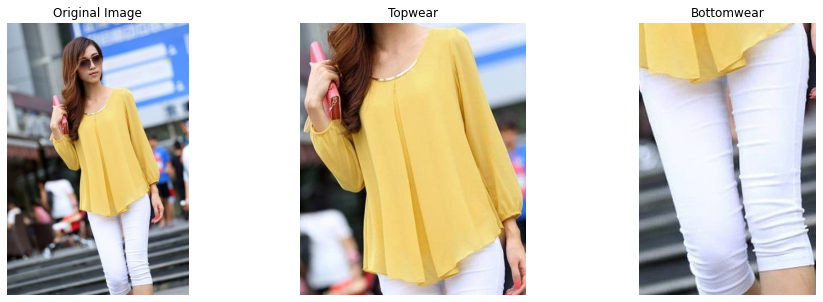

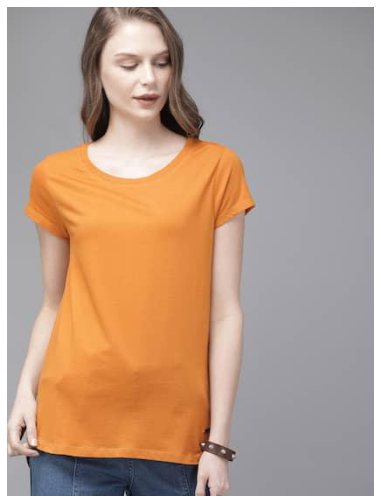

Shop Now @  https://www.myntra.com/tshirts/roadster/roadster-women-mustard-yellow-solid-round-neck-t-shirt/10778618/buy


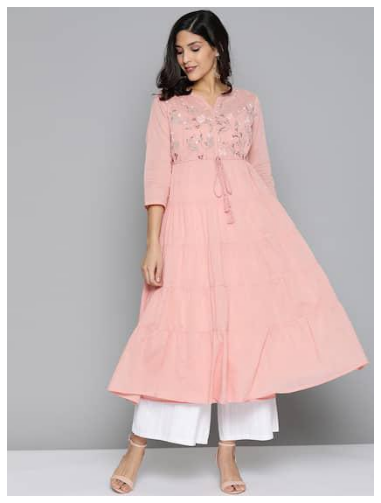

Shop Now @  https://www.myntra.com/kurtas/herenow/herenow-women-pink-yoke-design-tiered-a-line-kurta/12517740/buy


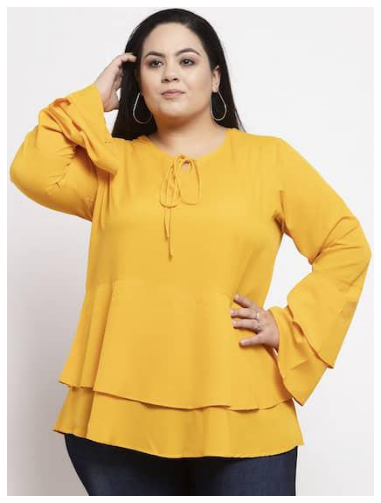

Shop Now @  https://www.myntra.com/tops/flambeur/flambeur-women-yellow-solid-a-line-top/13272808/buy


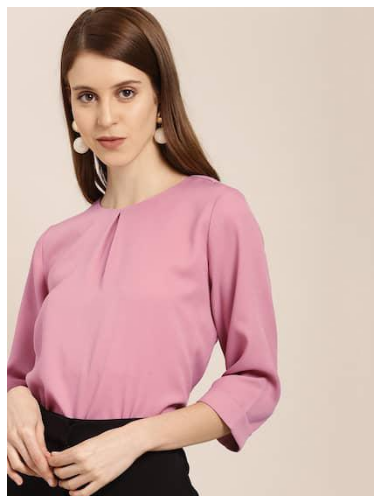

Shop Now @  https://www.myntra.com/tops/her-by-invictus/her-by-invictus-women-pink-solid-top/10374655/buy


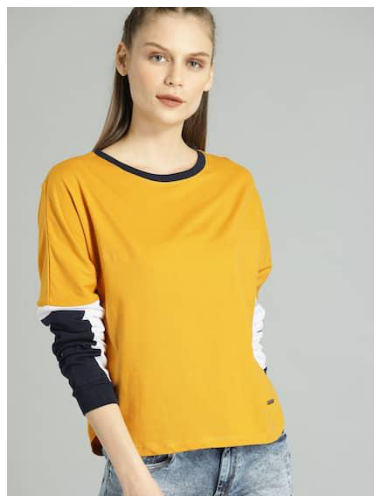

Shop Now @  https://www.myntra.com/tshirts/roadster/roadster-women-yellow-solid-round-neck-knitted-t-shirt/10197693/buy


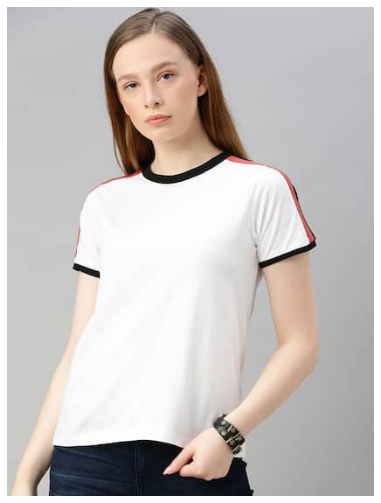

Shop Now @  https://www.myntra.com/tshirts/roadster/roadster-women-white-solid-round-neck-t-shirt/11893778/buy


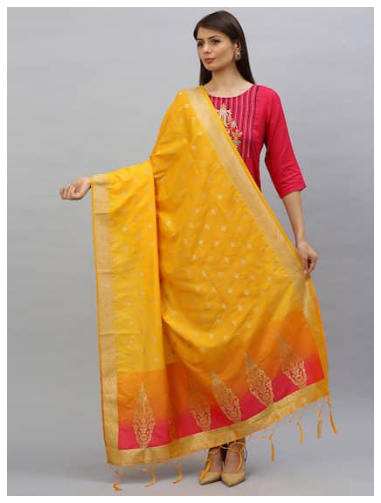

Shop Now @  https://www.myntra.com/dupatta/mimosa/mimosa-yellow--gold-toned-woven-design-banarasi-art-silk-dupatta/11775084/buy


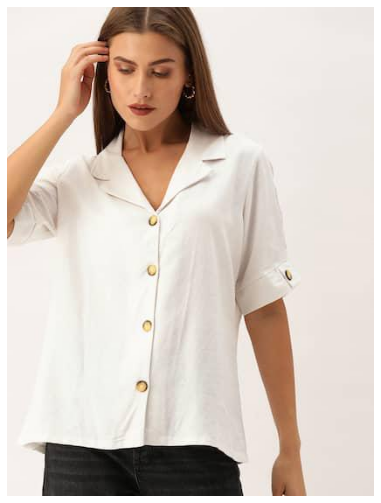

Shop Now @  https://www.myntra.com/shirts/and/and-women-white-solid-regular-fit-casual-shirt/11535072/buy


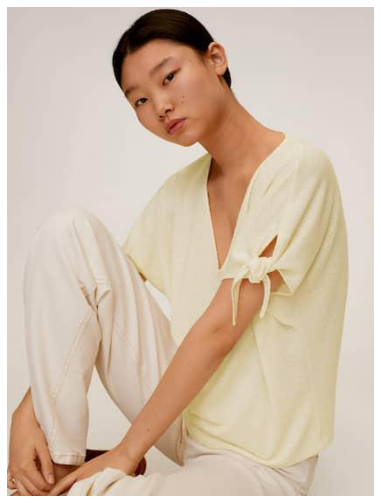

Shop Now @  https://www.myntra.com/tops/mango/mango-women-off-white-solid-boxy-top-with-tie-ups/12088642/buy


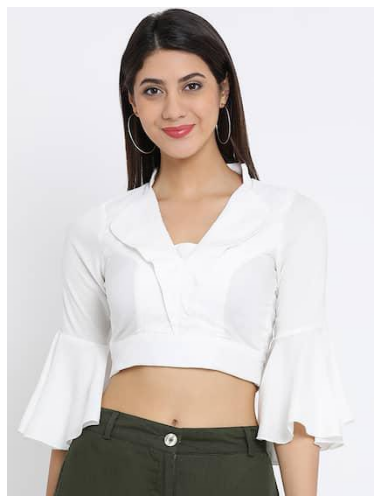

Shop Now @  https://www.myntra.com/tops/meee/meee-women-white-solid-fitted-top/9565703/buy


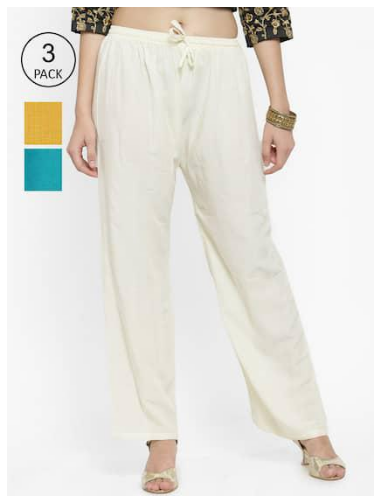

Shop Now @  https://www.myntra.com/palazzos/clora-creation/clora-creation-women-pack-of-3-mustard-yellow--white-solid-straight-palazzos/13906762/buy


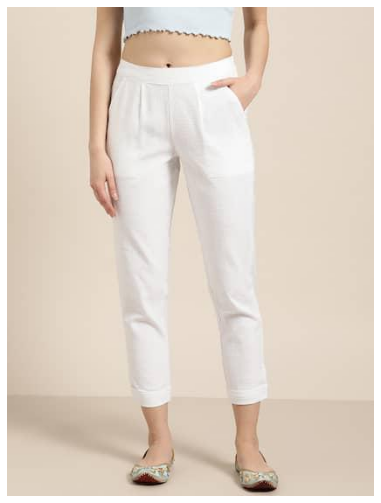

Shop Now @  https://www.myntra.com/trousers/jaipur-kurti/jaipur-kurti-women-white-regular-fit-solid-regular-cropped-trousers/11054006/buy


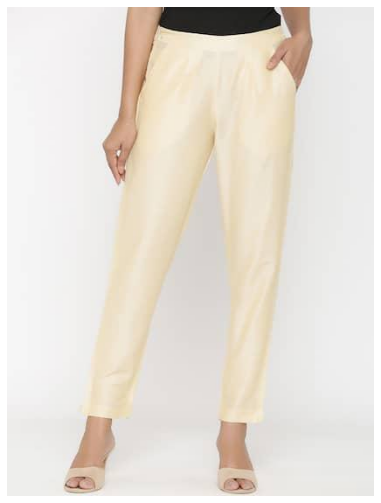

Shop Now @  https://www.myntra.com/trousers/rangmayee/rangmayee-women-cream-slim-fit-solid-cigarette-trousers/12947876/buy


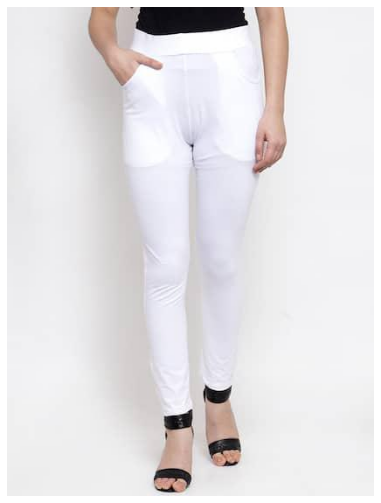

Shop Now @  https://www.myntra.com/jeggings/tag-7/tag-7-women-white-skinny-fit-solid-treggings/11347706/buy


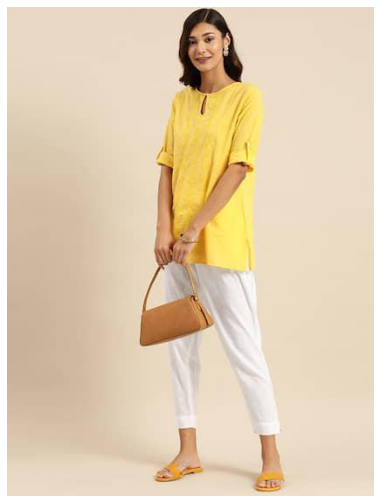

Shop Now @  https://www.myntra.com/trousers/rajnandini/rajnandini-women-white-relaxed-straight-leg-solid-regular-trousers/13481600/buy


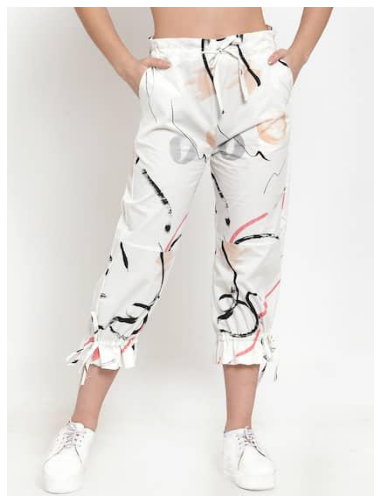

Shop Now @  https://www.myntra.com/capris/j-style/j-style-women-white--black-printed-slim-fit-capris/12030936/buy


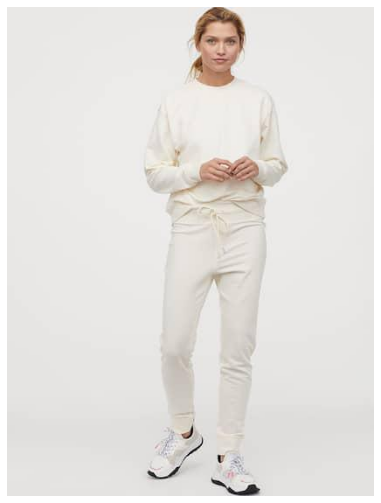

Shop Now @  https://www.myntra.com/trousers/hm/hm-women-white-cotton-blend-joggers/11706196/buy


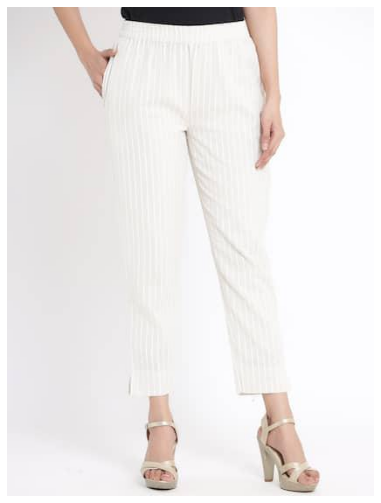

Shop Now @  https://www.myntra.com/trousers/juniper/juniper-women-off-white-slim-fit-striped-regular-trousers/13434598/buy


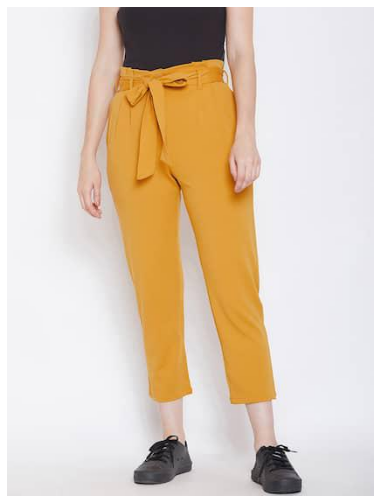

Shop Now @  https://www.myntra.com/trousers/zastraa/zastraa-women-mustard-yellow-slim-fit-solid-peg-trousers/9476139/buy


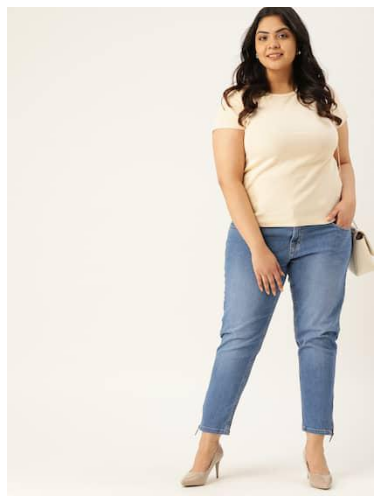

Shop Now @  https://www.myntra.com/jeans/sztori/sztori-women-plus-size-blue-skinny-fit-mid-rise-clean-look-stretchable-jeans/13489482/buy
{'topwear': [{'product_url': 'https://www.myntra.com/tshirts/roadster/roadster-women-mustard-yellow-solid-round-neck-t-shirt/10778618/buy', 'image_url': 'https://assets.myntassets.com/dpr_2,q_60,w_210,c_limit,fl_progressive/assets/images/10778618/2019/12/10/c037cb38-5249-469b-8c06-b715426c49a51575961518783-Roadster-Women-Tshirts-4641575961516251-1.jpg'}, {'product_url': 'https://www.myntra.com/kurtas/herenow/herenow-women-pink-yoke-design-tiered-a-line-kurta/12517740/buy', 'image_url': 'https://assets.myntassets.com/dpr_2,q_60,w_210,c_limit,fl_progressive/assets/images/12517740/2020/11/5/57f9339a-9125-4fa0-857d-9607f1d1a17b1604571591562-HERENOW-Women-Kurtas-5791604571589599-1.jpg'}, {'product_url': 'https://www.myntra.com/tops/flambeur/flambeur-women-yellow-solid-a-line-top/13272808/buy', 'image_url': 'https://assets.myntassets.com/dpr_2,q_60,w_210,c

In [13]:
img_path = "..\\google-image-search-database\\womens_casual_top_wear\\707be93f8e.jpg"
final(img_path)

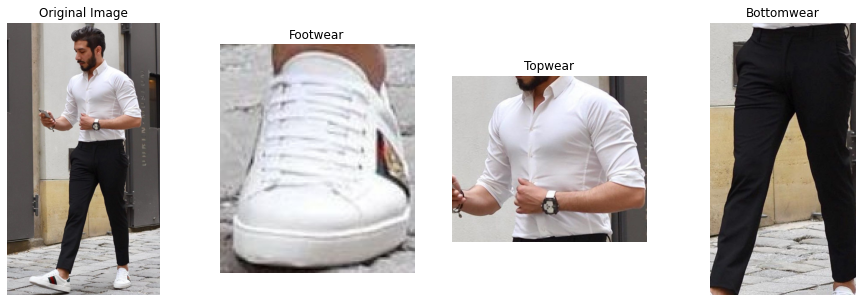

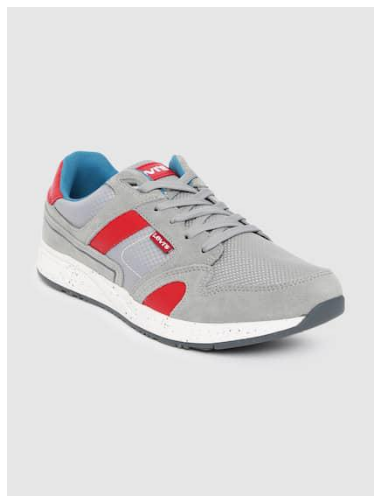

Shop Now @  https://www.myntra.com/casual-shoes/levis/levis-men-grey-colourblocked-sutter-sneakers/11368796/buy


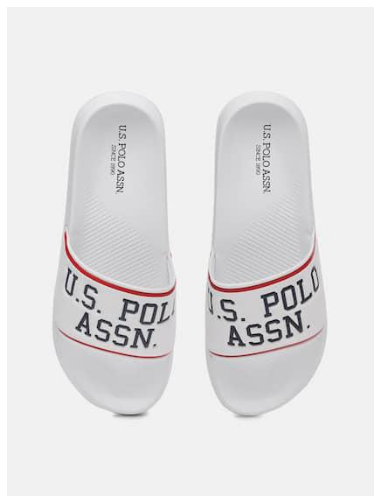

Shop Now @  https://www.myntra.com/flip-flops/us-polo-assn/us-polo-assn-men-white-printed-torres-20-sliders/12453158/buy


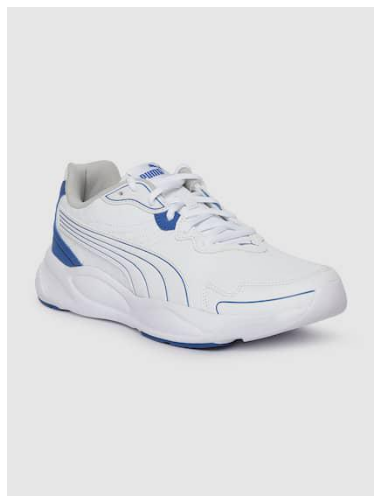

Shop Now @  https://www.myntra.com/casual-shoes/puma/puma-unisex-white-90s-runner-nu-wave-sig-sneakers/12281828/buy


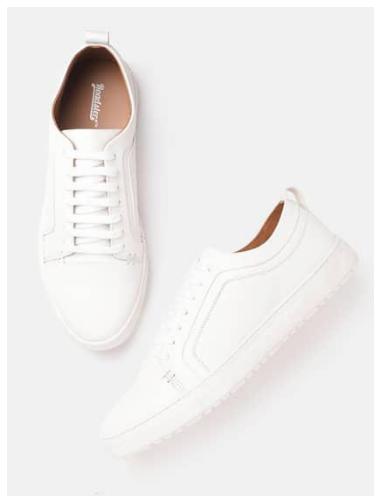

Shop Now @  https://www.myntra.com/casual-shoes/roadster/roadster-men-white-solid-sneakers/13334890/buy


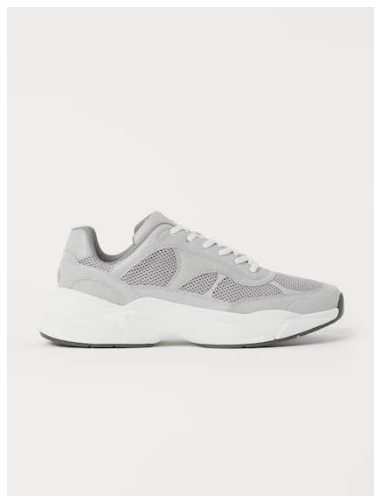

Shop Now @  https://www.myntra.com/casual-shoes/hm/hm-men-grey-chunky-soled-trainers/13652810/buy


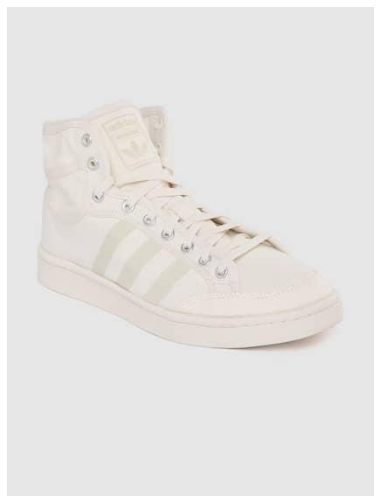

Shop Now @  https://www.myntra.com/casual-shoes/adidas-originals/adidas-originals-men-off-white-solid-mid-top-americana-decon-sneakers/11353334/buy


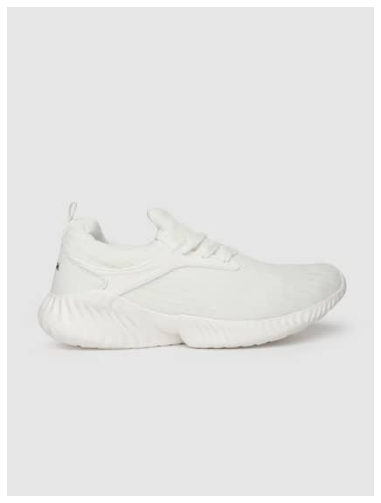

Shop Now @  https://www.myntra.com/casual-shoes/wrogn/wrogn-men-white-self-design-sneakers/13186528/buy


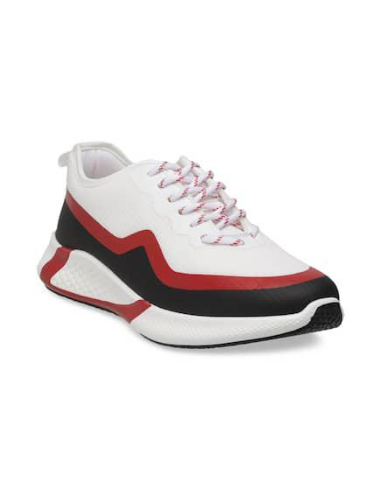

Shop Now @  https://www.myntra.com/casual-shoes/carlton-london-sports/carlton-london-sports-men-white--red-sneakers/12775080/buy


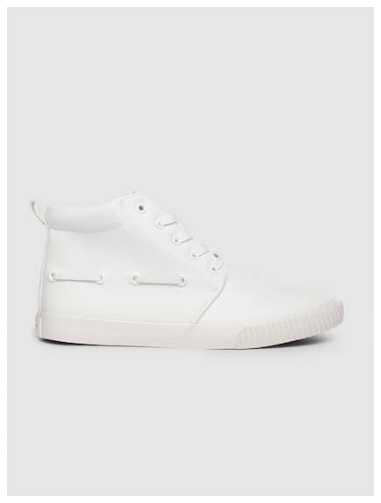

Shop Now @  https://www.myntra.com/casual-shoes/roadster/roadster-men-white-solid-synthetic-mid-top-sneakers/11752820/buy


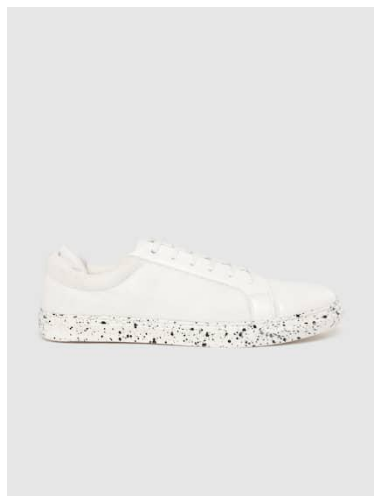

Shop Now @  https://www.myntra.com/casual-shoes/wrogn/wrogn-men-white-woven-design-sneakers/12703880/buy


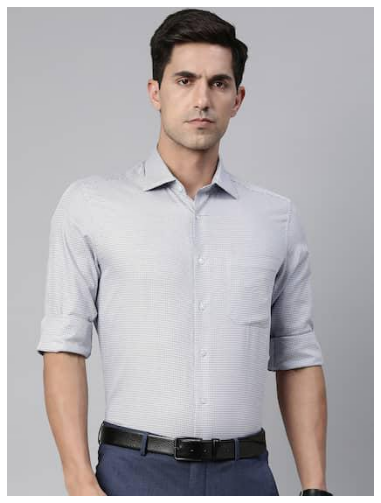

Shop Now @  https://www.myntra.com/shirts/louis-philippe/louis-philippe-men-grey--off-white-pure-cotton-checked-formal-shirt/13306064/buy


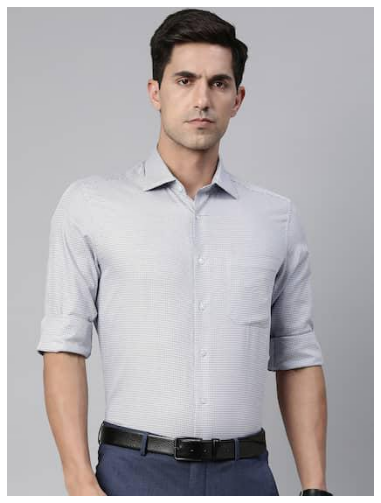

Shop Now @  https://www.myntra.com/shirts/louis-philippe/louis-philippe-men-grey--off-white-pure-cotton-checked-formal-shirt/13306064/buy


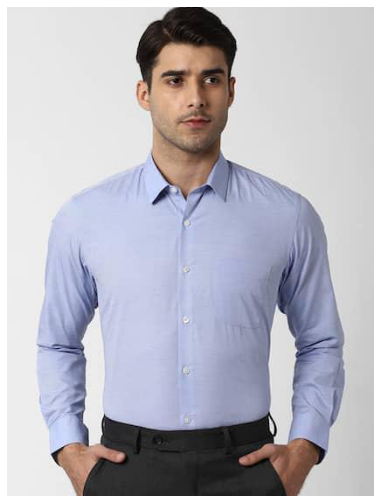

Shop Now @  https://www.myntra.com/shirts/peter-england/peter-england-men-blue-regular-fit-solid-formal-shirt/11225252/buy


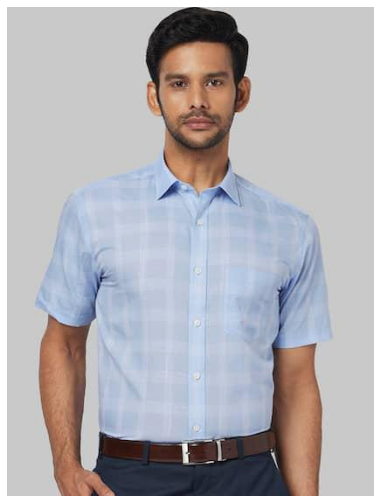

Shop Now @  https://www.myntra.com/shirts/park-avenue/park-avenue-men-blue--white-regular-fit-checked-formal-shirt/12997766/buy


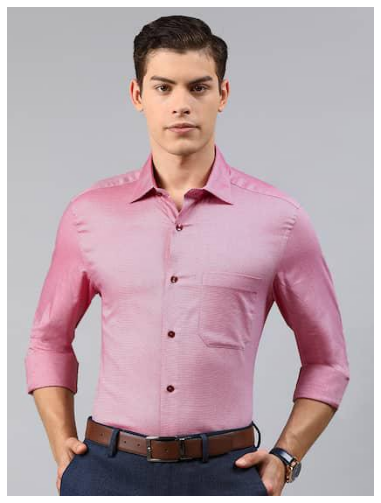

Shop Now @  https://www.myntra.com/shirts/louis-philippe/louis-philippe-men-red-regular-fit-printed-formal-shirt/12236650/buy


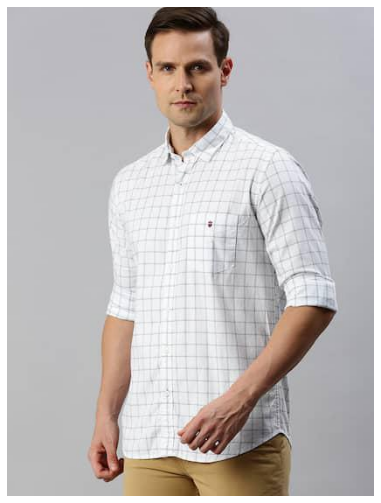

Shop Now @  https://www.myntra.com/shirts/louis-philippe-sport/louis-philippe-sport-men-white--black-slim-fit-checked-casual-cotton-shirt/12237476/buy


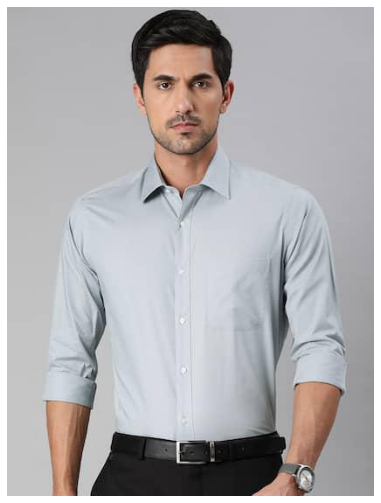

Shop Now @  https://www.myntra.com/shirts/raymond/raymond-men-grey-slim-fit-solid-formal-shirt/11015738/buy


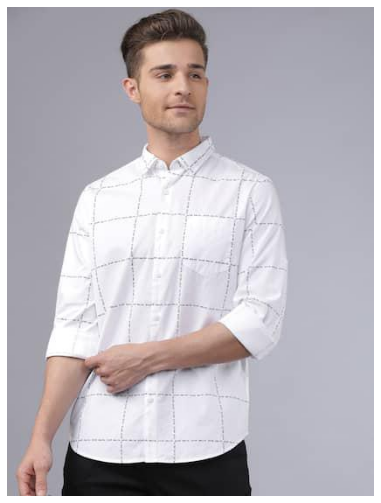

Shop Now @  https://www.myntra.com/shirts/ecko-unltd/ecko-unltd-men-white-slim-fit-checked-casual-shirt/12008776/buy


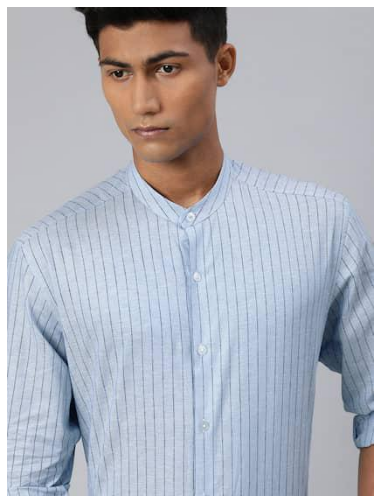

Shop Now @  https://www.myntra.com/shirts/louis-philippe/louis-philippe-men-blue-slim-fit-striped-formal-shirt/12780952/buy


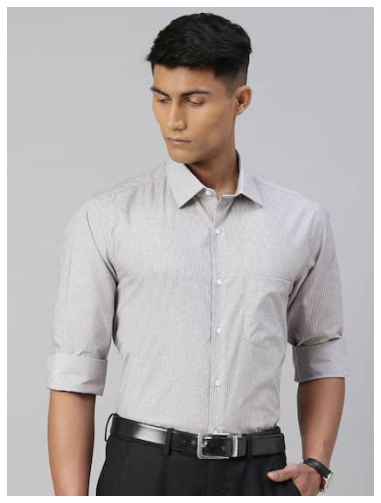

Shop Now @  https://www.myntra.com/shirts/van-heusen/van-heusen-men-grey--white-custom-fit-striped-formal-shirt/13492116/buy


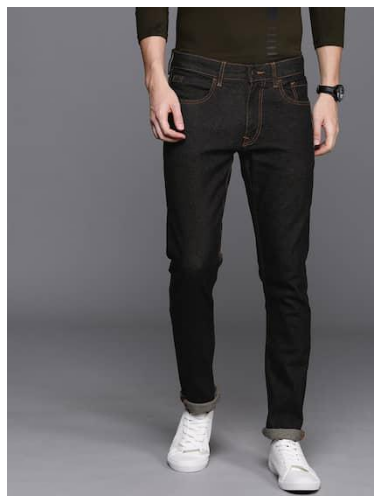

Shop Now @  https://www.myntra.com/jeans/wrogn/wrogn-men-black-slim-fit-mid-rise-clean-look-stretchable-jeans/11362702/buy


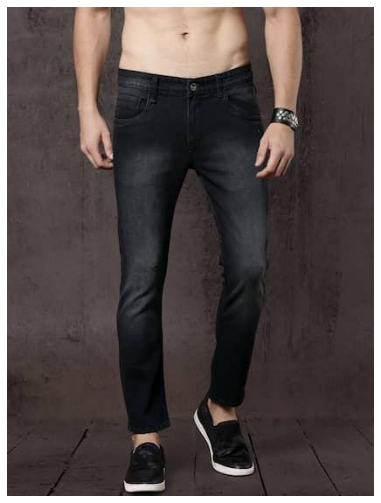

Shop Now @  https://www.myntra.com/jeans/roadster/roadster-men-black-skinny-fit-mid-rise-clean-look-stretchable-ankle-length-jeans/2311938/buy


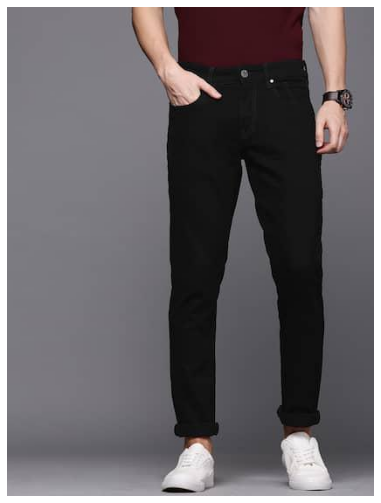

Shop Now @  https://www.myntra.com/jeans/wrogn/wrogn-men-black-slim-fit-mid-rise-clean-look-stretchable-jeans/1729344/buy


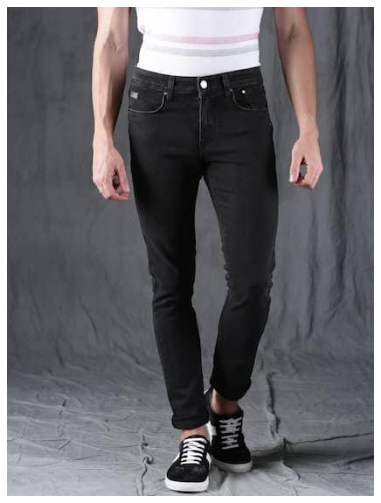

Shop Now @  https://www.myntra.com/jeans/wrogn/wrogn-men-black-slim-fit-mid-rise-clean-look-stretchable-jeans/2338087/buy


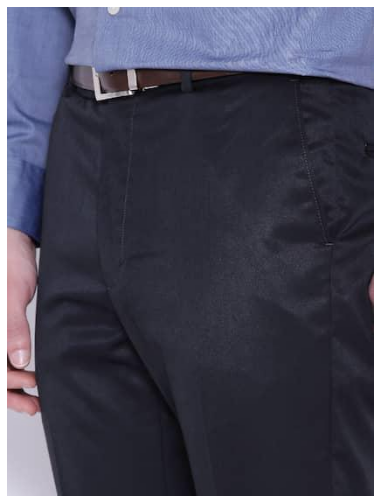

Shop Now @  https://www.myntra.com/trousers/arrow/arrow-men-navy-tapered-fit-formal-trousers/379237/buy


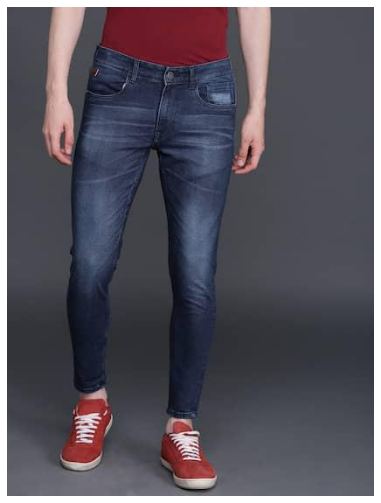

Shop Now @  https://www.myntra.com/jeans/wrogn/wrogn-men-blue-tapered-fit-mid-rise-clean-look-stretchable-cropped-jeans/10187343/buy


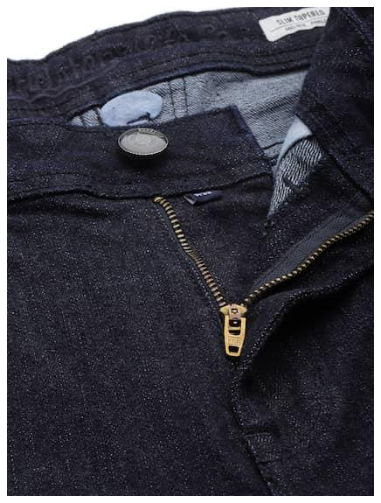

Shop Now @  https://www.myntra.com/jeans/roadster/roadster-men-navy-blue-skinny-fit-mid-rise-clean-look-stretchable-jeans/13031938/buy


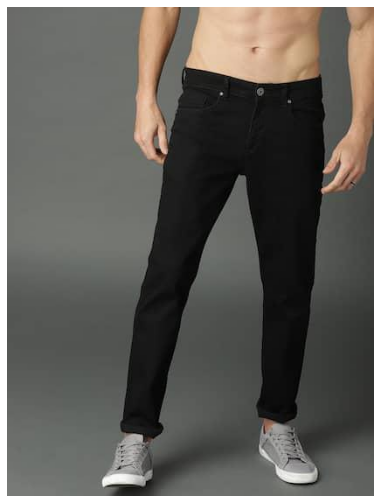

Shop Now @  https://www.myntra.com/jeans/roadster/roadster-men-black-slim-fit-mid-rise-clean-look-stretchable-jeans/7139482/buy


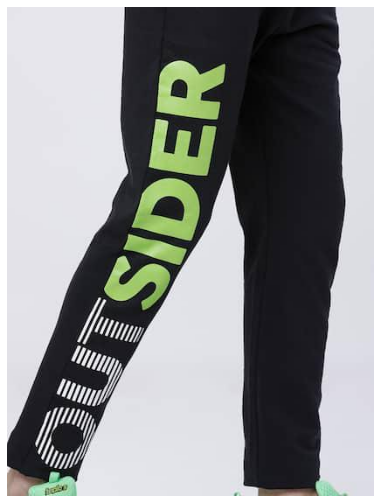

Shop Now @  https://www.myntra.com/track-pants/locomotive/locomotive-men-black--yellow-solid-slim--fit-track-pants/13671222/buy


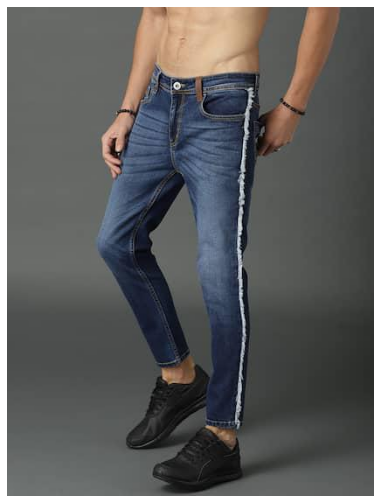

Shop Now @  https://www.myntra.com/jeans/roadster/roadster-men-blue-skinny-fit-mid-rise-clean-look-stretchable-jeans/7029111/buy


In [19]:
img_path = "..\\google-image-search-database\\mens_formal_top_wear\\3cf46ceef5.jpg"
final(img_path)

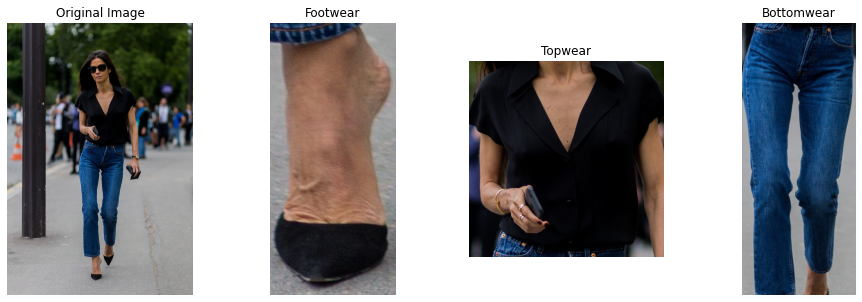

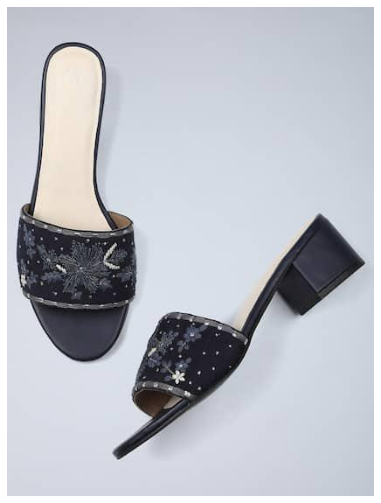

Shop Now @  https://www.myntra.com/heels/w/w-women-navy-blue-embellished-block-heels/12269448/buy


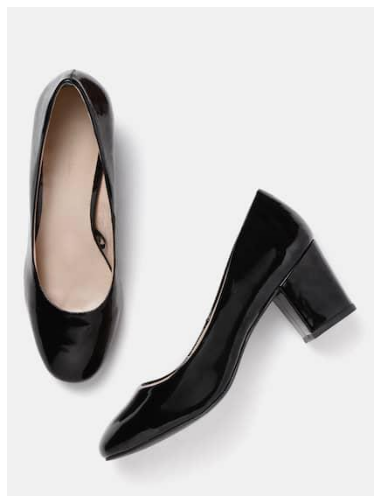

Shop Now @  https://www.myntra.com/heels/mast--harbour/mast--harbour-women-black-solid-pumps/10648034/buy


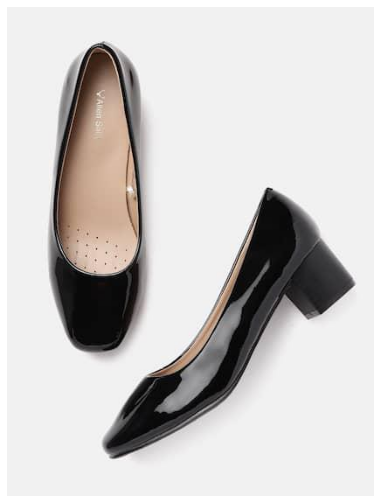

Shop Now @  https://www.myntra.com/heels/allen-solly/allen-solly-women-black-solid-pumps/11074790/buy


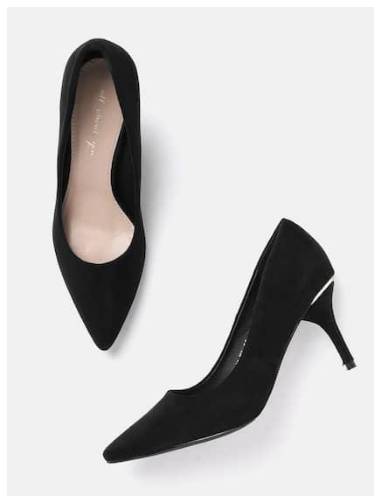

Shop Now @  https://www.myntra.com/heels/all-about-you/all-about-you-women-black-solid-pumps/11218236/buy


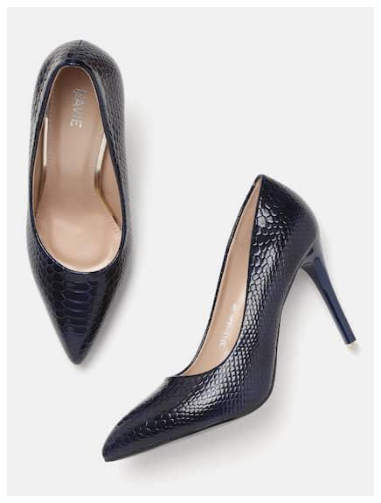

Shop Now @  https://www.myntra.com/heels/lavie/lavie-women-navy-blue-snakeskin-textured-pumps/10965574/buy


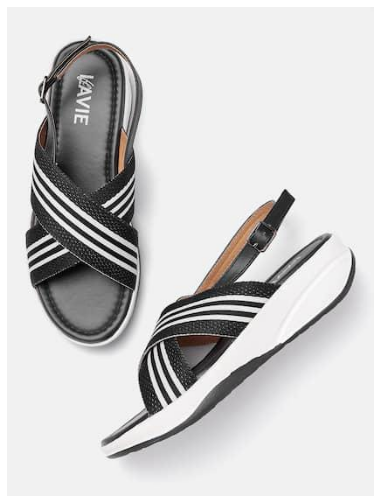

Shop Now @  https://www.myntra.com/heels/lavie/lavie-women-black--white-striped-comfort-heels/13871772/buy


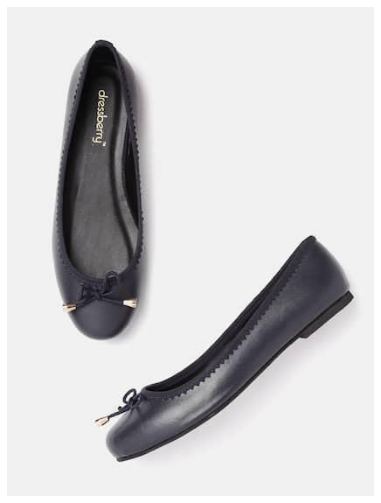

Shop Now @  https://www.myntra.com/flats/dressberry/dressberry-women-navy-blue-solid-ballerinas-with-bow-detail/13347808/buy


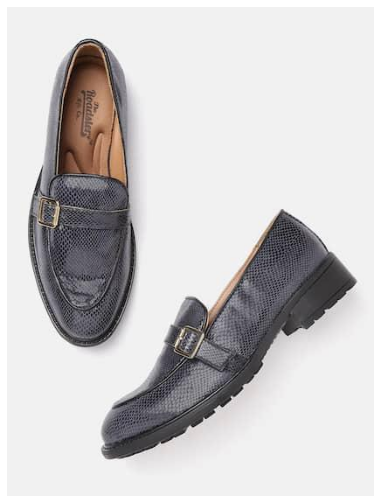

Shop Now @  https://www.myntra.com/casual-shoes/roadster/roadster-women-navy-blue-snakeskin-textured-penny-loafers-with-buckle-detail/13572502/buy


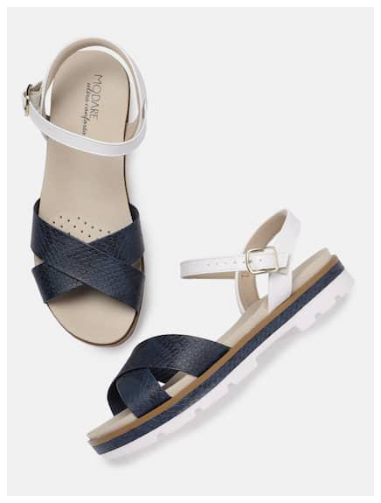

Shop Now @  https://www.myntra.com/flats/modare/modare-women-navy-blue-textured-open-toe-flats/11674632/buy


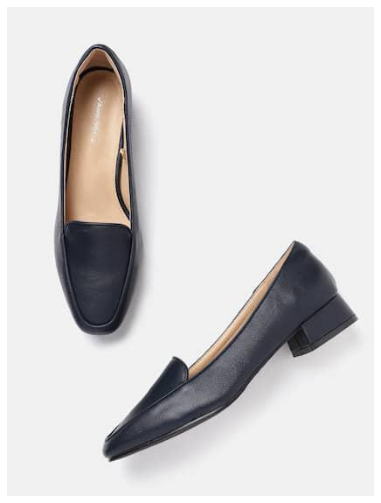

Shop Now @  https://www.myntra.com/heels/allen-solly/allen-solly-women-navy-blue-solid-pumps/13474422/buy


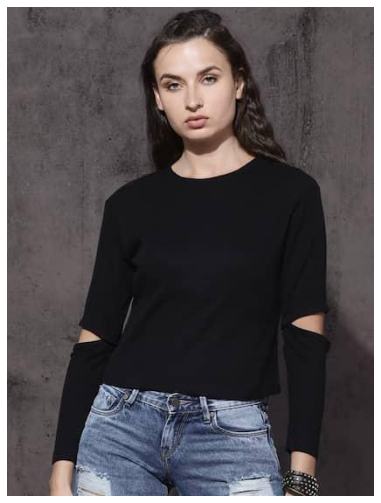

Shop Now @  https://www.myntra.com/tops/roadster/roadster-women-black-solid-top/2312853/buy


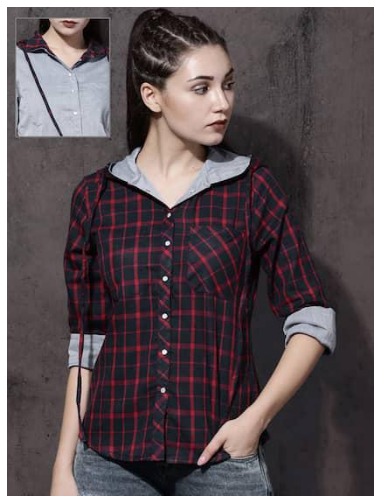

Shop Now @  https://www.myntra.com/shirts/roadster/roadster-women-navy-blue--blue-regular-fit-checked-casual-shirt/2418013/buy


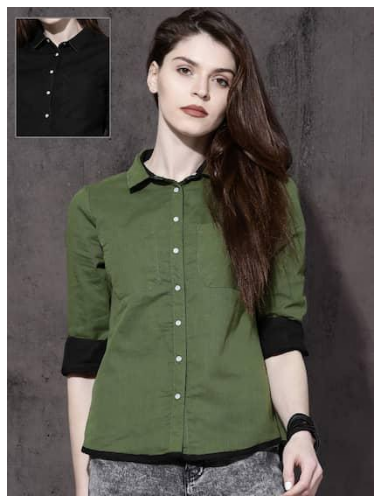

Shop Now @  https://www.myntra.com/shirts/roadster/roadster-women-olive-green--black-regular-fit-solid-casual-shirt/2318019/buy


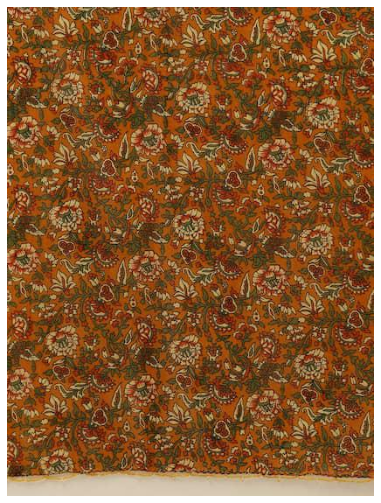

Shop Now @  https://www.myntra.com/dupatta/shaily/shaily-mustard--green-printed-dupatta/11969340/buy


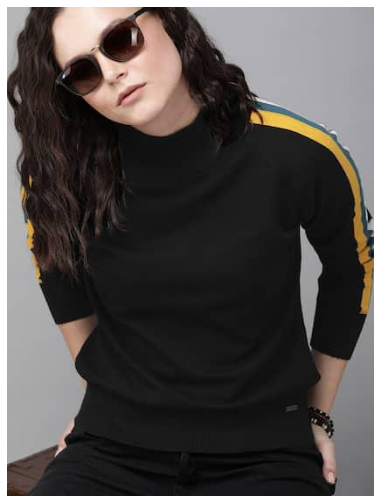

Shop Now @  https://www.myntra.com/tops/roadster/roadster-women-black-solid-top-with-side-stripes/10856446/buy


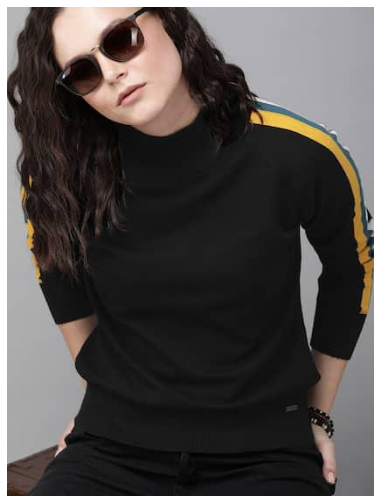

Shop Now @  https://www.myntra.com/tops/roadster/roadster-women-black-solid-top-with-side-stripes/10856446/buy


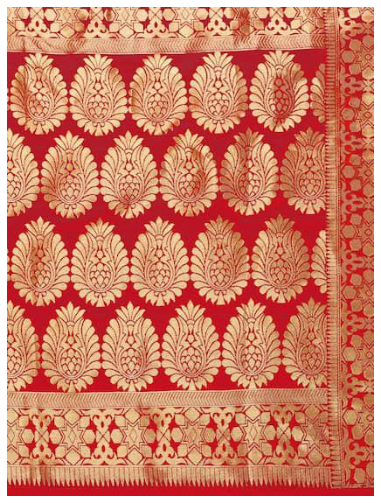

Shop Now @  https://www.myntra.com/dupatta/blissta/blissta-red--gold-toned-woven-design-dupatta/7079362/buy


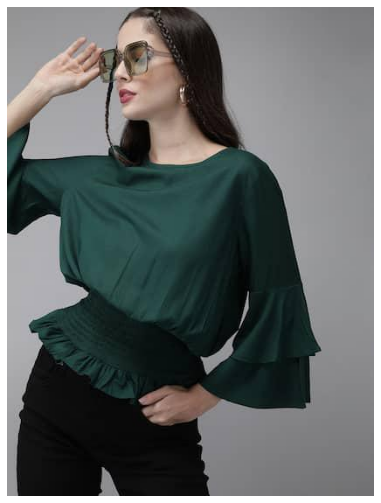

Shop Now @  https://www.myntra.com/tops/roadster/roadster-greenturn-women-green-eco-friendly-viscose-solid-smocked-cinched-waist-top/12191166/buy


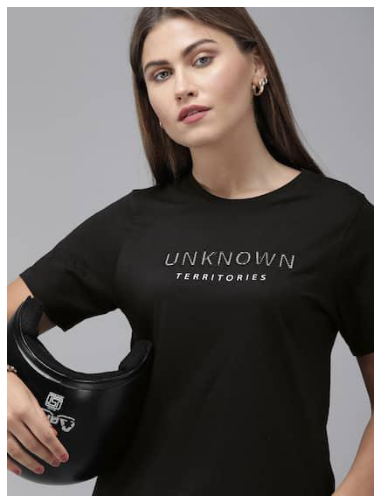

Shop Now @  https://www.myntra.com/tshirts/roadster/roadster-women-black-printed-round-neck-t-shirt-with-applique-detail/12193242/buy


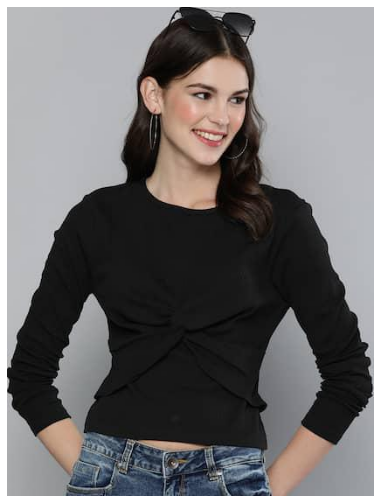

Shop Now @  https://www.myntra.com/tops/herenow/herenow-women-black-ribbed-regular-crop-top-with-twisted-detailing/12969720/buy


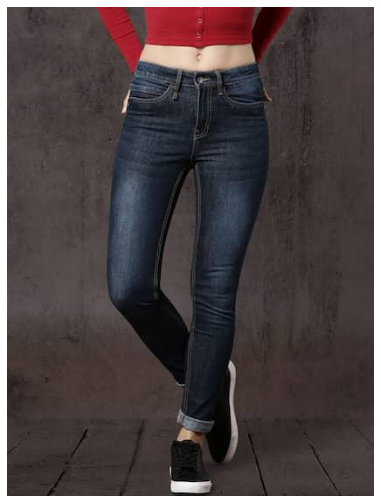

Shop Now @  https://www.myntra.com/jeans/roadster/roadster-women-blue-skinny-fit-mid-rise-clean-look-stretchable-jeans/2128199/buy


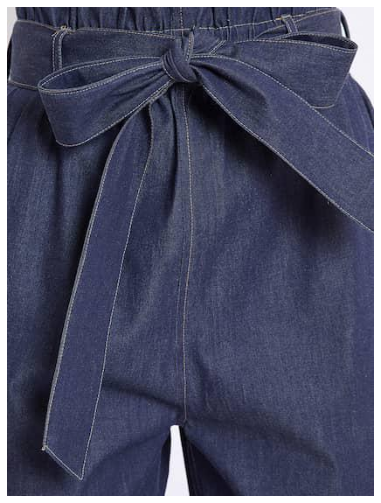

Shop Now @  https://www.myntra.com/trousers/zastraa/zastraa-women-blue-loose-fit-solid-denim-peg-trousers/7702709/buy


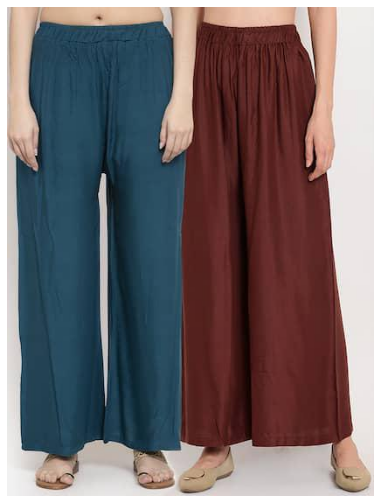

Shop Now @  https://www.myntra.com/palazzos/tag-7/tag-7-women-set-of-2-blue--brown-solid-flared-palazzos/12734290/buy


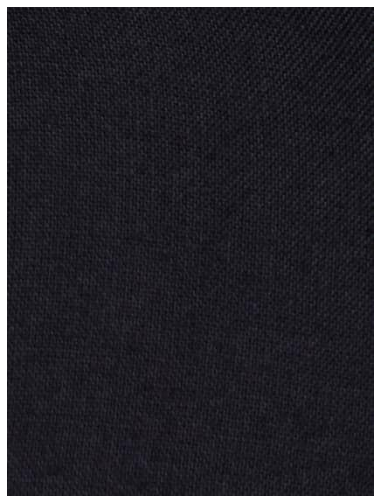

Shop Now @  https://www.myntra.com/trousers/melange-by-lifestyle/melange-by-lifestyle-women-black-regular-fit-solid-anti-fit-trousers/11710818/buy


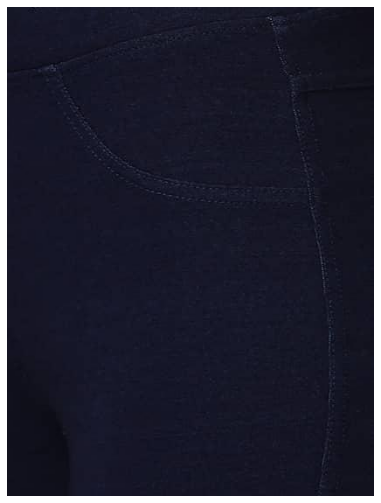

Shop Now @  https://www.myntra.com/jeggings/twin-birds/twin-birds-women-navy-blue-solid-jeggings/13129078/buy


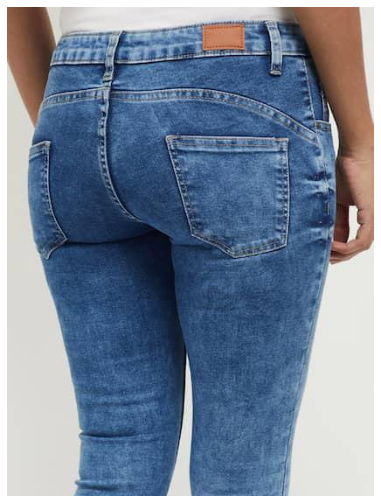

Shop Now @  https://www.myntra.com/jeans/max/max-women-blue-skinny-fit-low-rise-clean-look-stretchable-jeans/13507366/buy


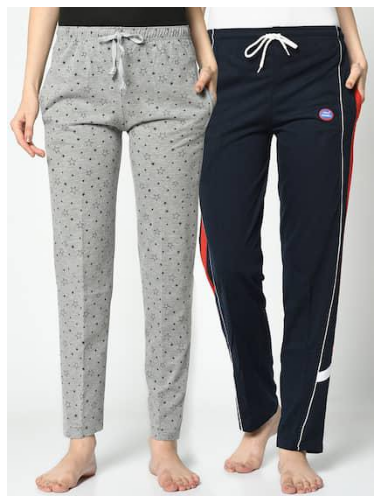

Shop Now @  https://www.myntra.com/track-pants/vimal-jonney/vimal-jonney-women-pack-of-2-track-pants/13318538/buy


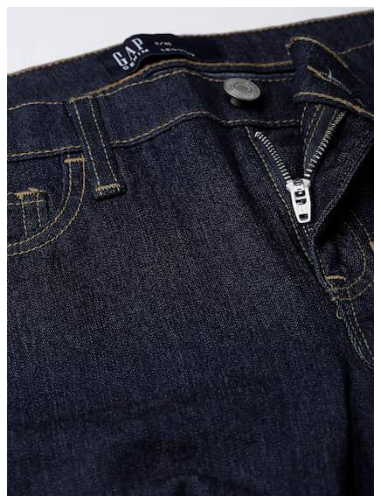

Shop Now @  https://www.myntra.com/jeans/gap/gap-mid-rise-favorite-jeggings/10243563/buy


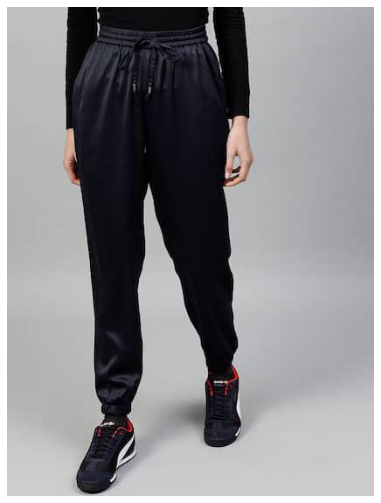

Shop Now @  https://www.myntra.com/trousers/street-9/street-9-women-navy-blue-regular-fit-solid-joggers/13738582/buy


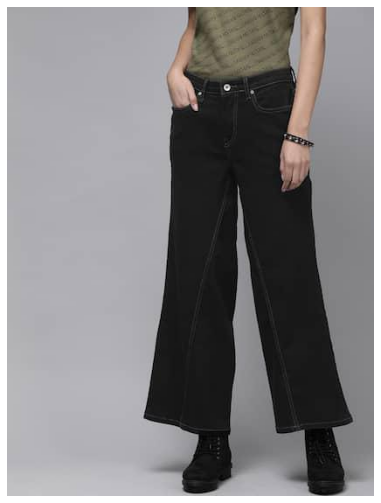

Shop Now @  https://www.myntra.com/jeans/roadster/roadster-women-black-wide-leg-mid-rise-clean-look-stretchable-jeans/11541916/buy


In [16]:
img_path = "..\\google-image-search-database\\womens_casual_top_wear\\dd35ba9fdd.jpg"
final(img_path)

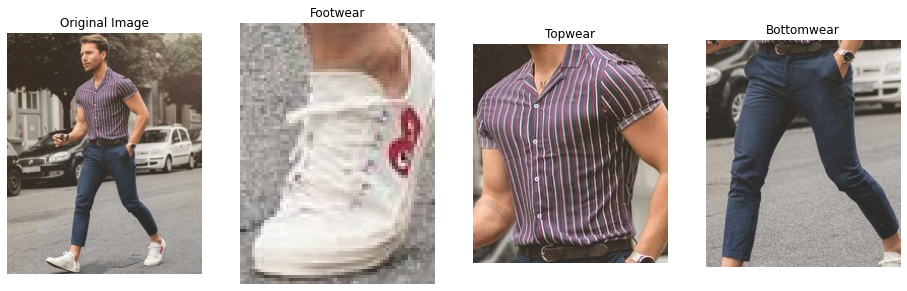

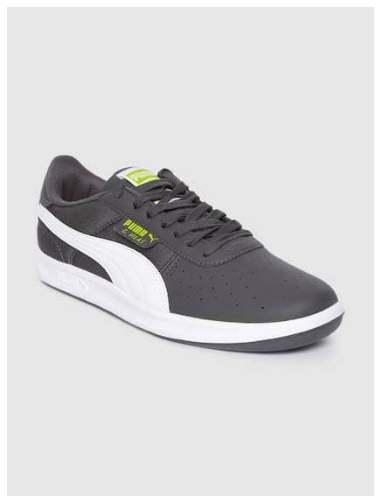

Shop Now @  https://www.myntra.com/casual-shoes/puma/puma-men-grey-perforations-g-vilas-2-core-idp-sneakers/13486800/buy


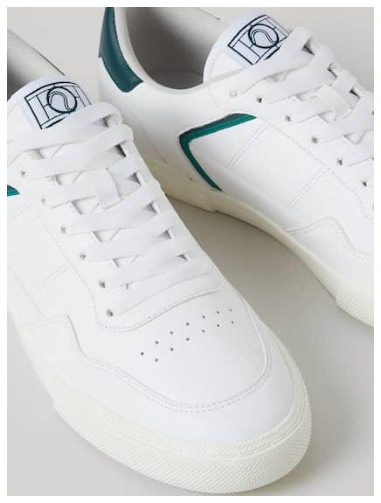

Shop Now @  https://www.myntra.com/casual-shoes/hm/hm-men-white-trainers/13661966/buy


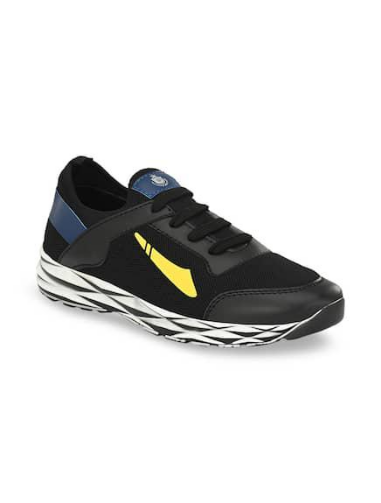

Shop Now @  https://www.myntra.com/casual-shoes/walkstyle-by-el-paso/walkstyle-by-el-paso-men-black-sneakers/13428428/buy


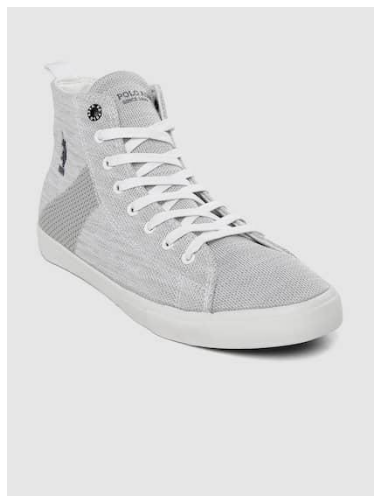

Shop Now @  https://www.myntra.com/casual-shoes/us-polo-assn/us-polo-assn-men-grey-solid-mid-top-sneakers/10331453/buy


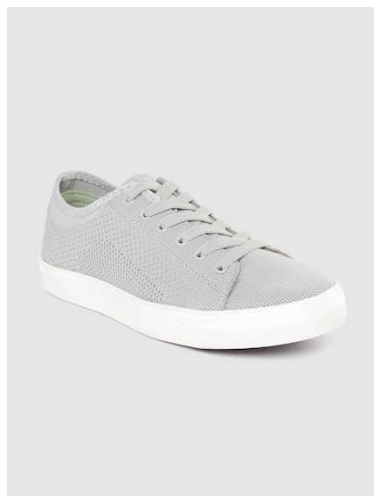

Shop Now @  https://www.myntra.com/casual-shoes/kook-n-keech/kook-n-keech-men-grey-woven-design-sneakers/11279458/buy


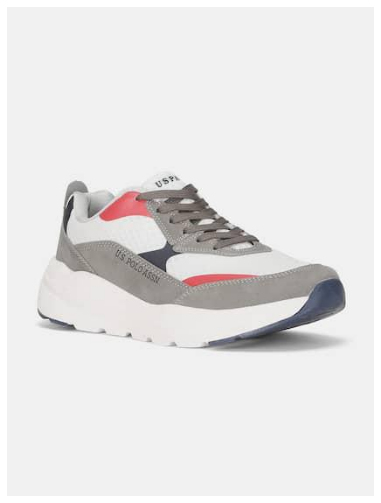

Shop Now @  https://www.myntra.com/casual-shoes/us-polo-assn/us-polo-assn-men-off-white-leather-sneakers/11783562/buy


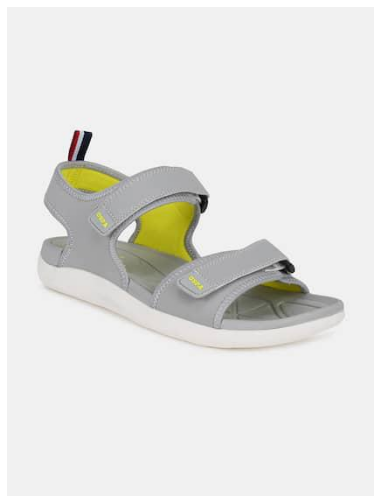

Shop Now @  https://www.myntra.com/sports-sandals/us-polo-assn/us-polo-assn-men-grey-solid-sports-sandals/13790204/buy


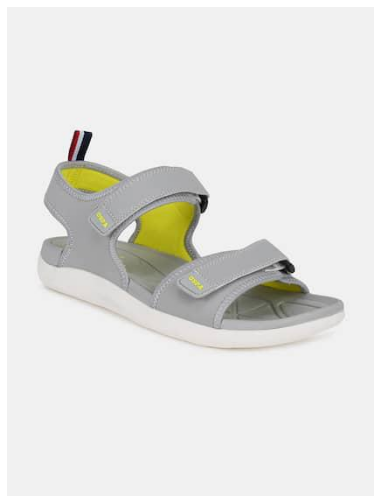

Shop Now @  https://www.myntra.com/sports-sandals/us-polo-assn/us-polo-assn-men-grey-solid-sports-sandals/13790204/buy


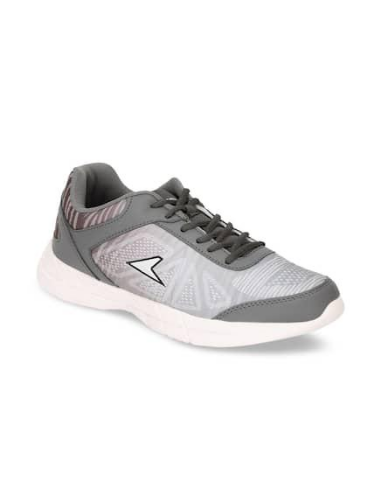

Shop Now @  https://www.myntra.com/sports-shoes/power/power-men-grey-running-shoes/12453872/buy


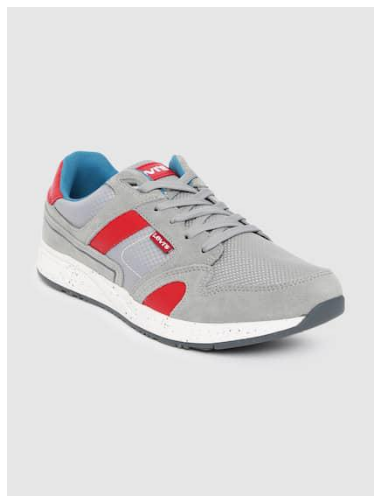

Shop Now @  https://www.myntra.com/casual-shoes/levis/levis-men-grey-colourblocked-sutter-sneakers/11368796/buy


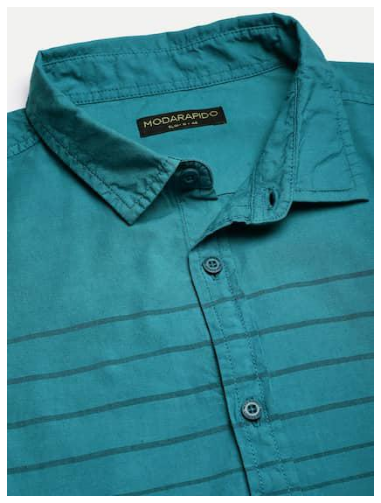

Shop Now @  https://www.myntra.com/shirts/moda-rapido/moda-rapido-men-teal-blue-regular-fit-striped-casual-shirt/11629154/buy


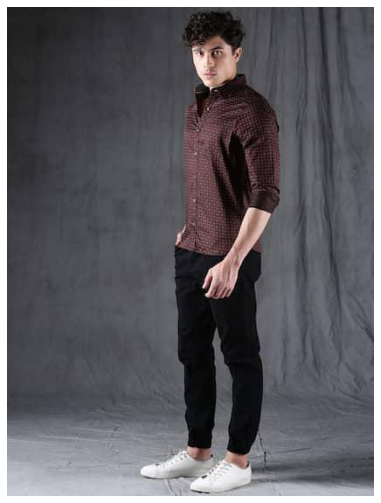

Shop Now @  https://www.myntra.com/shirts/wrogn/wrogn-men-burgundy-slim-fit-printed-casual-shirt/2338589/buy


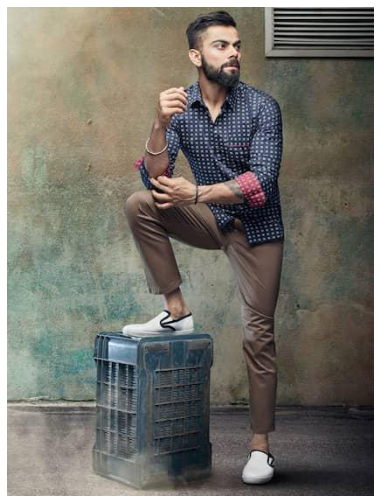

Shop Now @  https://www.myntra.com/shirts/wrogn/wrogn-men-navy-slim-fit-printed-casual-shirt/1427724/buy


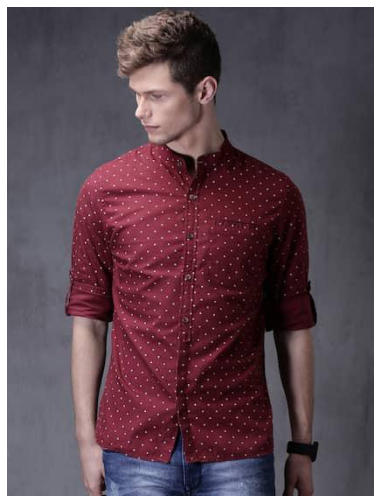

Shop Now @  https://www.myntra.com/shirts/wrogn/wrogn-maroon-printed-slim-fit-casual-shirt/1421955/buy


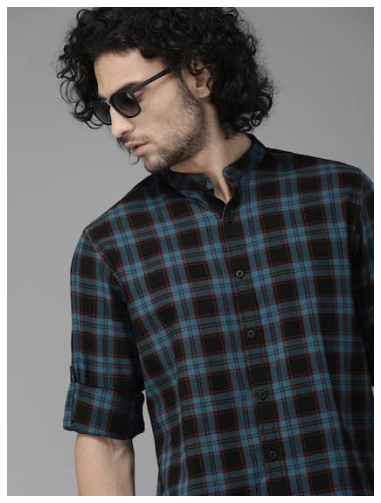

Shop Now @  https://www.myntra.com/shirts/roadster/roadster-men-black--teal-blue-regular-fit-checked-casual-shirt/12947744/buy


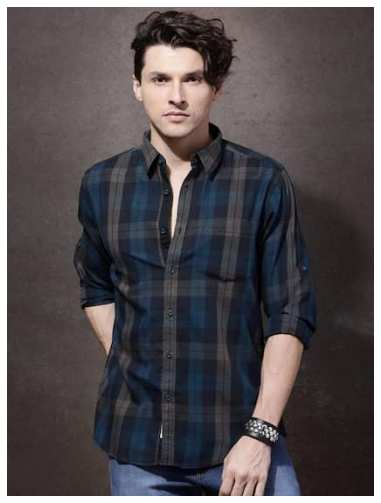

Shop Now @  https://www.myntra.com/shirts/roadster/roadster-men-navy--grey-checked-casual-shirt/1667044/buy


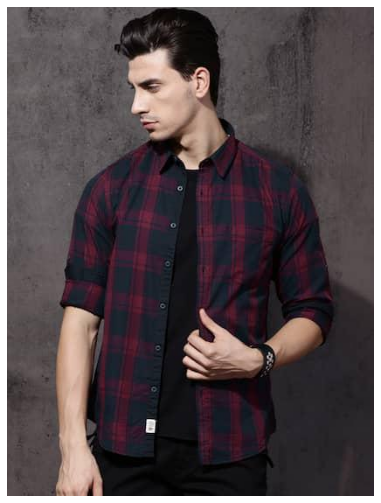

Shop Now @  https://www.myntra.com/shirts/roadster/roadster-men-navy-blue--maroon-regular-fit-checked-casual-shirt/2284680/buy


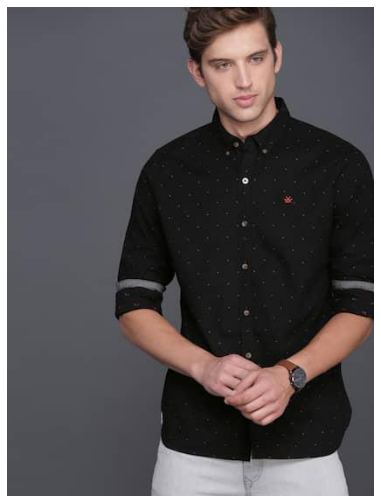

Shop Now @  https://www.myntra.com/shirts/wrogn/wrogn-men-black-regular-fit-self-design-casual-shirt/8681955/buy


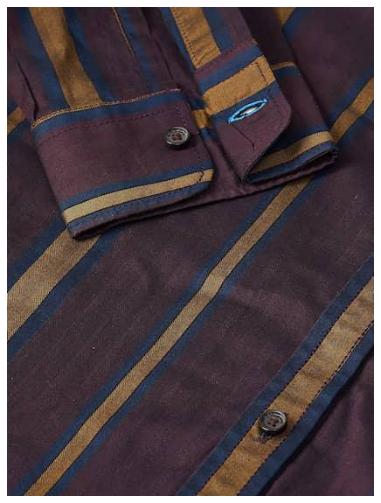

Shop Now @  https://www.myntra.com/shirts/blackberrys/blackberrys-men-burgundy--mustard-yellow-slim-fit-striped-casual-shirt/11190074/buy


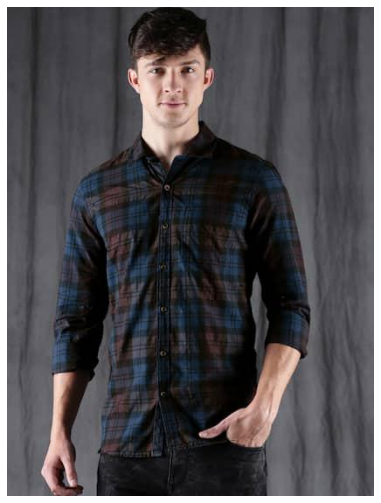

Shop Now @  https://www.myntra.com/shirts/wrogn/wrogn-men-blue--brown-slim-fit-checked-casual-shirt/2032637/buy


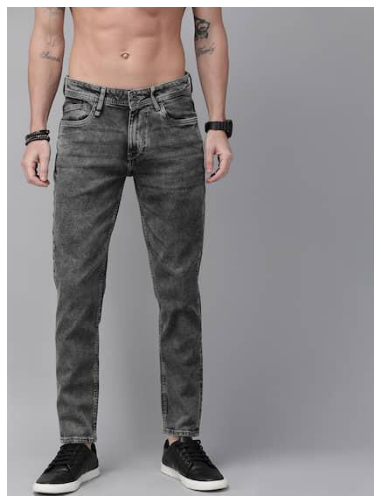

Shop Now @  https://www.myntra.com/jeans/roadster/roadster-men-grey-slim-tapered-fit-mid-rise-clean-look-stretchable-jeans/13032510/buy


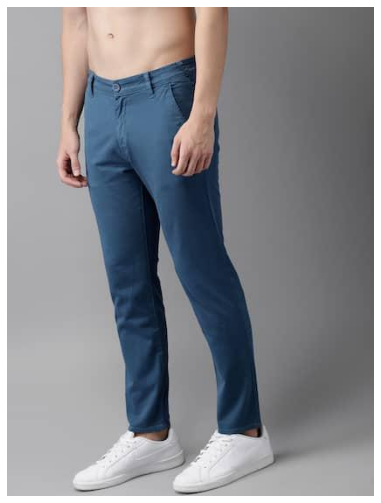

Shop Now @  https://www.myntra.com/trousers/herenow/herenow-men-blue-slim-fit-solid-chinos/9064393/buy


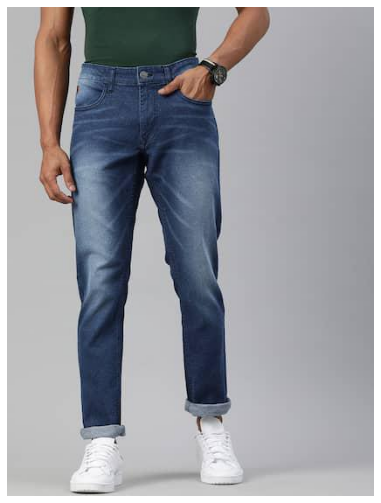

Shop Now @  https://www.myntra.com/jeans/wrogn/wrogn-men-blue-slim-fit-mid-rise-clean-look-stretchable-jeans/13673588/buy


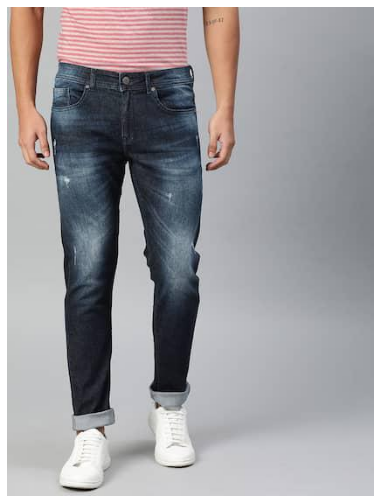

Shop Now @  https://www.myntra.com/jeans/american-crew/american-crew-men-blue-slim-fit-mid-rise-low-distress-stretchable-jeans/11395048/buy


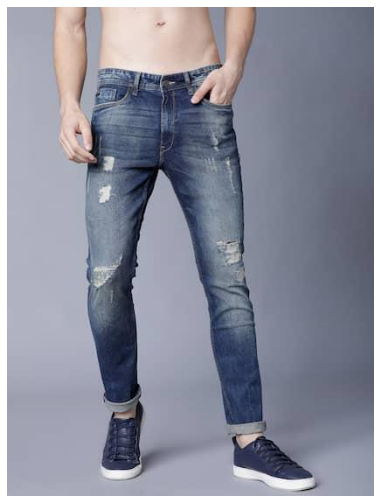

Shop Now @  https://www.myntra.com/jeans/locomotive/locomotive-men-blue-slim-fit-mid-rise-highly-distressed-stretchable-jeans/7584915/buy


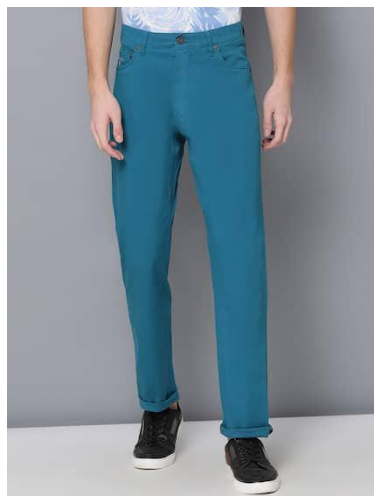

Shop Now @  https://www.myntra.com/jeans/gant/gant-men-blue-slim-fit-mid-rise-clean-look-stretchable-jeans/12467374/buy


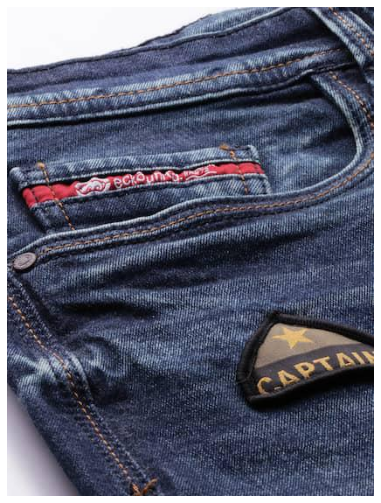

Shop Now @  https://www.myntra.com/jeans/ecko-unltd/ecko-unltd-men-blue-slim-tapered-fit-mid-rise-clean-look-stretchable-ankle-length-jeans/10245817/buy


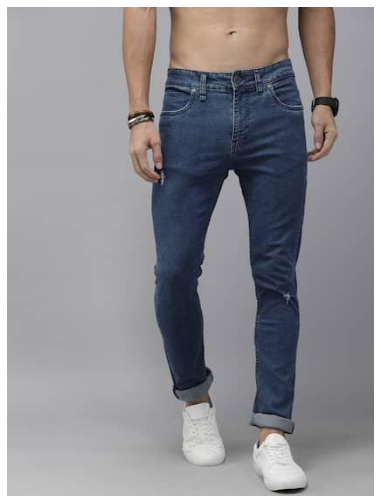

Shop Now @  https://www.myntra.com/jeans/roadster/roadster-men-navy-blue-skinny-fit-mid-rise-low-distressed-stretchable-jeans/12358496/buy


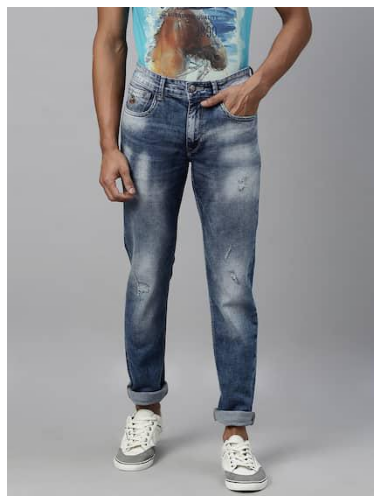

Shop Now @  https://www.myntra.com/jeans/us-polo-assn-denim-co/us-polo-assn-denim-co-men-blue-slim-fit-mid-rise-mildly-distressed-stretchable-jeans/13043162/buy


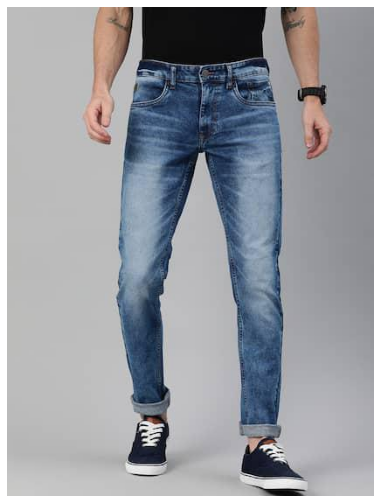

Shop Now @  https://www.myntra.com/jeans/wrogn/wrogn-men-blue-slim-fit-mid-rise-clean-look-stretchable-jeans/13673586/buy


In [17]:
img_path = "..\\google-image-search-database\\mens_formal_top_wear\\f6c91729cb.jpg"
final(img_path)